## Exercise 1

In [88]:
import os


import geopandas as gpd
from  fiona import listlayers

#maps
turkeyMaps='https://github.com/1IAS21-Tarea/tarea3/raw/main/maps/turkeyMaps_5636.gpkg'
#layers in maps
listlayers(turkeyMaps)

['country', 'cities', 'rivers']

In [89]:
turkey=gpd.read_file(turkeyMaps,layer='country')
turkey_cities=gpd.read_file(turkeyMaps,layer='cities')
turkey_rivers=gpd.read_file(turkeyMaps,layer='rivers')

In [90]:
#they share the same CRS
turkey.crs.to_epsg()==turkey_cities.crs.to_epsg()==turkey_rivers.crs.to_epsg()

True

<Axes: >

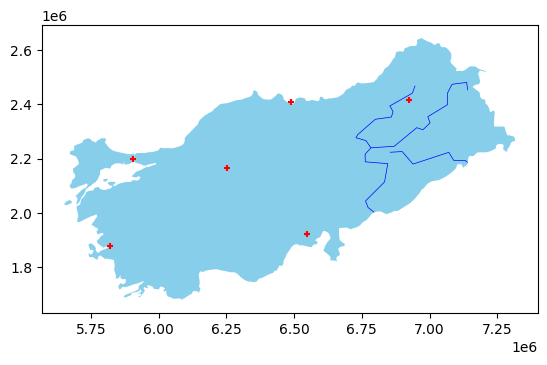

In [91]:
# plotting
base = turkey.plot(facecolor="skyblue")
turkey_rivers.plot(edgecolor='blue', linewidth=0.5,ax=base)
turkey_cities.plot(marker='+', color='red', markersize=15,ax=base)

#### 1. Check if your country is a polygon or multipolygon.

In [92]:
turkey

,COUNTRY,geometry
0,Turkey,"MULTIPOLYGON (((5732203.788 2108442.488, 57267..."


In [93]:
turkey.boundary

0    MULTILINESTRING ((5732203.788 2108442.488, 572...
dtype: geometry

#### 2. Recover just the boundaries of that country.

<Axes: >

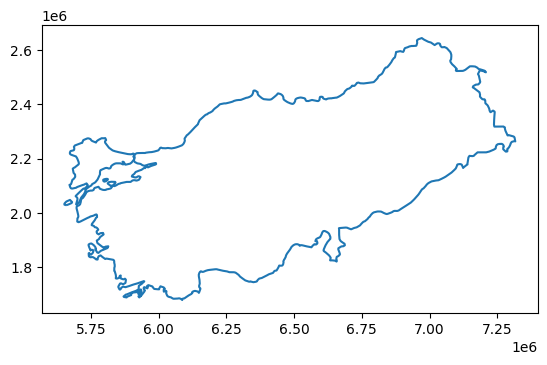

In [94]:
# This is just the borderline
turkey.boundary.plot()

#### 3. Turn the boundary into a GDF

In [95]:
# does 'boundary' return a GDF?
type(turkey.boundary)

geopandas.geoseries.GeoSeries

In [96]:
# converting into GDF
turkey.boundary.to_frame()

,0
0,"MULTILINESTRING ((5732203.788 2108442.488, 572..."


In [97]:
# conversion
turkey_border=turkey.boundary.to_frame() 

# new column (optional)
turkey_border['name']='Turkey' 

# renaming the geometry column
turkey_border.rename(columns={0:'geometry'},inplace=True) 

#setting the geometry (the name is not enough)
turkey_border = turkey_border.set_geometry("geometry")

# verifying:
turkey_border.crs

<Projected CRS: EPSG:5636>
Name: TUREF / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Türkiye (Turkey) - onshore and offshore.
- bounds: (25.62, 34.42, 44.83, 43.45)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: Turkish National Reference Frame
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [98]:
turkey_border

,geometry,name
0,"MULTILINESTRING ((5732203.788 2108442.488, 572...",Turkey


## Exercise 2



1. Look for sub administrative divisions of your country
2. Check all the CRSs of those divisions
3. If you find one CRS is missing, fill the CRS with the right projection.


In [99]:

turkey_states=gpd.read_file(os.path.join("maps","turkey_administrativelevels0_1_2","tur_polbnda_adm1.shp"))
turkey_municipalities=gpd.read_file(os.path.join("maps","turkey_administrativelevels0_1_2","tur_polbna_adm2.shp"))


In [100]:
turkey_states.crs, turkey_municipalities.crs

(<Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich,
 <Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

<Axes: >

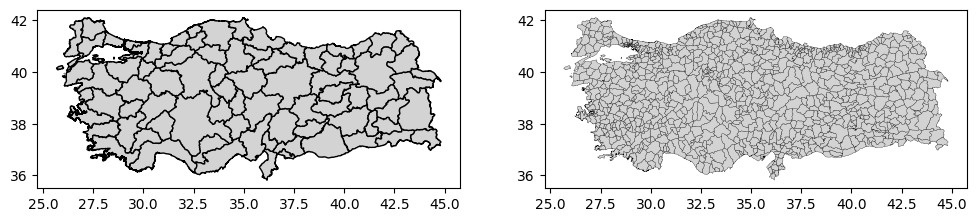

In [101]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=False, sharey=False, figsize=(12,12))

turkey_states.plot(ax=ax1, facecolor='lightgrey', edgecolor='black')
turkey_municipalities.plot(ax=ax2, facecolor='lightgrey', edgecolor='black',linewidth=0.2)

In [102]:
turkey_states.to_crs(5636)

,adm1_tr,adm1_en,adm1,Shape_Leng,Shape_Area,adm0_en,adm0_tr,adm0,geometry
0,ADANA,ADANA,TUR001,8.271786,1.407083,TURKEY,TÜRKİYE,TUR,"POLYGON ((6585169.605 2094294.231, 6585322.304..."
1,ADIYAMAN,ADIYAMAN,TUR002,5.494422,0.750561,TURKEY,TÜRKİYE,TUR,"POLYGON ((6831168.105 2168080.489, 6831208.622..."
2,AFYONKARAHİSAR,AFYONKARAHISAR,TUR003,7.149996,1.450064,TURKEY,TÜRKİYE,TUR,"POLYGON ((6130493.329 2050861.809, 6131483.414..."
3,AĞRI,AGRI,TUR004,6.588304,1.163170,TURKEY,TÜRKİYE,TUR,"POLYGON ((7074552.214 2499952.630, 7075048.933..."
4,AKSARAY,AKSARAY,TUR068,4.432509,0.790388,TURKEY,TÜRKİYE,TUR,"POLYGON ((6369925.724 2098748.403, 6369956.738..."
...,...,...,...,...,...,...,...,...,...
76,UŞAK,USAK,TUR064,3.864988,0.574221,TURKEY,TÜRKİYE,TUR,"POLYGON ((6022731.414 1982126.172, 6023013.762..."
77,VAN,VAN,TUR065,8.362708,2.159743,TURKEY,TÜRKİYE,TUR,"POLYGON ((7147523.281 2453879.976, 7147809.205..."
78,YALOVA,YALOVA,TUR077,2.051652,0.087016,TURKEY,TÜRKİYE,TUR,"POLYGON ((5957548.401 2173893.230, 5957825.307..."
79,YOZGAT,YOZGAT,TUR066,6.386410,1.436743,TURKEY,TÜRKİYE,TUR,"POLYGON ((6446232.355 2266670.734, 6446430.888..."


In [103]:
turkey_states.geometry.head()

0    POLYGON ((36.31587 38.36376, 36.31769 38.36367...
1    POLYGON ((39.25297 38.18188, 39.25334 38.18159...
2    POLYGON ((31.14797 39.26246, 31.15825 39.25753...
3    POLYGON ((43.28706 40.01281, 43.29129 40.00884...
4    POLYGON ((33.96446 39.03804, 33.96453 39.03723...
Name: geometry, dtype: geometry

In [104]:
turkey_states.crs = "EPSG:4326"
turkey_municipalities.crs = "EPSG:4326"

In [105]:
turkey_states=turkey_states.to_crs(5636)
turkey_municipalities=turkey_municipalities.to_crs(5636)

## Exercise 3
1. Look for some points in a CSV file about your country.
    
2. Turn those points into a spatial object.
    
3. Save the layer.

In [106]:
import pandas as pd 
infoairports=pd.read_csv(os.path.join("data","tr-airports.csv"))

# see

infoairports

,id,ident,type,name,latitude_deg,longitude_deg,elevation_ft,continent,country_name,iso_country,...,municipality,scheduled_service,gps_code,iata_code,local_code,home_link,wikipedia_link,keywords,score,last_updated
0,#meta +id,#meta +code,#loc +airport +type,#loc +airport +name,#geo +lat,#geo +lon,#geo +elevation +ft,#region +continent +code,#country +name,#country +code +iso2,...,#loc +municipality +name,#status +scheduled,#loc +airport +code +gps,#loc +airport +code +iata,#loc +airport +code +local,#meta +url +airport,#meta +url +wikipedia,#meta +keywords,#meta +score,#date +updated
1,4528,LTBA,large_airport,İstanbul Atatürk Airport,40.971913,28.823714,163,EU,Turkey,TR,...,"Bakırköy, Istanbul",1,LTBA,ISL,NaN,http://www.ataturkairport.com/eng/,https://en.wikipedia.org/wiki/Istanbul_Atat%C3...,"Ataturk, Yeşilköy, Yesilkoy",1015875,2022-02-24T10:29:57+00:00
2,4515,LTAI,large_airport,Antalya International Airport,36.898701,30.800501,177,AS,Turkey,TR,...,Antalya,1,LTAI,AYT,NaN,http://www.antalya.dhmi.gov.tr/havaalanlari/de...,https://en.wikipedia.org/wiki/Antalya_Airport,NaN,51150,2016-05-20T02:42:02+00:00
3,4569,LTFJ,large_airport,Istanbul Sabiha Gökçen International Airport,40.898602,29.3092,312,AS,Turkey,TR,...,"Pendik, Istanbul",1,LTFJ,SAW,NaN,http://www.sgairport.com/,https://en.wikipedia.org/wiki/Istanbul_Sabiha_...,Sabiha Gökçen Havalimanı,1275,2021-01-10T01:47:24+00:00
4,317457,LTFM,large_airport,İstanbul Airport,41.261297,28.741951,325,EU,Turkey,TR,...,"Arnavutköy, Istanbul",1,LTFM,IST,NaN,http://www.igairport.com/en,https://en.wikipedia.org/wiki/Istanbul_Airport,NaN,1000,2022-02-24T10:22:37+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
309,339006,TR-0069,heliport,Adana 112 Heliport,37.00791,35.34182,NaN,AS,Turkey,TR,...,Yüreğir,0,NaN,NaN,NaN,NaN,NaN,NaN,0,2021-01-10T09:23:50+00:00
310,339007,TR-0070,heliport,Adana Sağlık Heliport,37.00712,35.34112,NaN,AS,Turkey,TR,...,Yüreğir,0,NaN,NaN,NaN,NaN,NaN,NaN,0,2021-03-05T16:39:40+00:00
311,339008,TR-0071,heliport,Adana City Training and Research Hospital,37.0299,35.34716,NaN,AS,Turkey,TR,...,Yüreğir,0,NaN,NaN,NaN,NaN,NaN,NaN,0,2021-01-10T09:30:24+00:00
312,338981,TR-0047,heliport,Zeytinburnu Pier Helipad,40.98072,28.89584,NaN,EU,Turkey,TR,...,"Zeytinburnu, Istanbul",0,NaN,NaN,NaN,NaN,NaN,NaN,0,2022-02-24T10:30:41+00:00


In [107]:
# bye first row 
infoairports.drop(index=0,inplace=True)
infoairports.reset_index(drop=True, inplace=True)

# keep the  columns needed
keep=['name','type','latitude_deg', 'longitude_deg','elevation_ft','region_name','municipality']
infoairports=infoairports.loc[:,keep]
infoairports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 313 entries, 0 to 312
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   name           313 non-null    object
 1   type           313 non-null    object
 2   latitude_deg   313 non-null    object
 3   longitude_deg  313 non-null    object
 4   elevation_ft   165 non-null    object
 5   region_name    313 non-null    object
 6   municipality   298 non-null    object
dtypes: object(7)
memory usage: 17.2+ KB


In [108]:
numericCols=['latitude_deg', 'longitude_deg','elevation_ft']
infoairports[numericCols]=infoairports.loc[:,numericCols].apply(lambda x:pd.to_numeric(x))

# now 
infoairports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 313 entries, 0 to 312
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           313 non-null    object 
 1   type           313 non-null    object 
 2   latitude_deg   313 non-null    float64
 3   longitude_deg  313 non-null    float64
 4   elevation_ft   165 non-null    float64
 5   region_name    313 non-null    object 
 6   municipality   298 non-null    object 
dtypes: float64(3), object(4)
memory usage: 17.2+ KB


<Axes: xlabel='longitude_deg', ylabel='latitude_deg'>

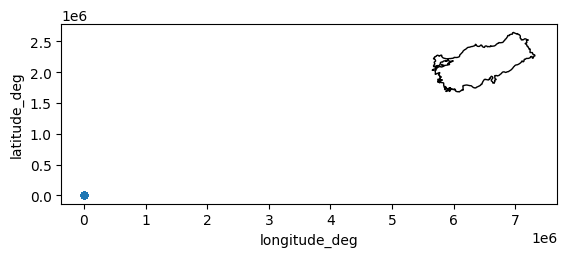

In [109]:
# let's plot

base = turkey.plot(color='white', edgecolor='black') #unprojected

infoairports.plot.scatter(x = 'longitude_deg', y = 'latitude_deg',ax=base)

In [110]:
airports=gpd.GeoDataFrame(data=infoairports.copy(),
                 geometry=gpd.points_from_xy(infoairports.longitude_deg,
                                             infoairports.latitude_deg), 
                 crs=4326)# the coordinates were in degrees - unprojected

In [111]:
airports=airports.to_crs(5636)

<Axes: >

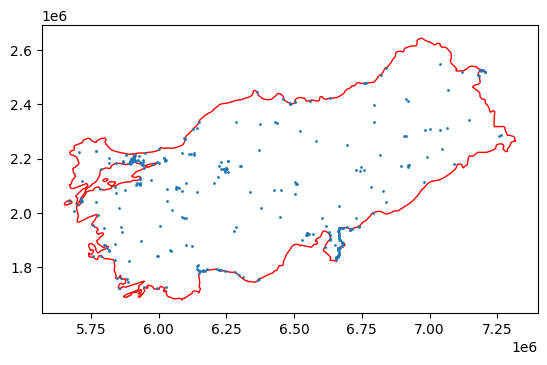

In [112]:
# let's plot

base = turkey.plot(color='white', edgecolor='red')
airports.plot(ax=base,markersize=1)

In [113]:
#remember:
type(airports), type(infoairports)

(geopandas.geodataframe.GeoDataFrame, pandas.core.frame.DataFrame)

In [114]:
airports['type'].value_counts() # this will not work: airports.type.value_counts()

type
heliport          182
medium_airport     54
small_airport      52
closed             16
large_airport       8
balloonport         1
Name: count, dtype: int64

In [115]:
airports.rename(columns={'type':'kind'},inplace=True)

In [116]:
from folium import LayerControl


m = airports[airports.kind=='small_airport'].explore(color="red",name="small",show=False)
m = airports[airports.kind=='medium_airport'].explore(m=m, color="blue",name="medium",show=False)
m = airports[airports.kind=='large_airport'].explore(m=m, color="black",name="large",show=True)
#m = airports[airports.kind=='seaplane_base'].explore(m=m, color="green",name="seaplane",show=False)
m = airports[airports.kind=='closed'].explore(m=m, color="white",name="closed",show=False)
m = airports[airports.kind=='heliport'].explore(m=m, color="orange",name="heliport",show=False)

LayerControl(collapsed=False).add_to(m) #optional

m


In [117]:
airports.to_file(os.path.join("maps","turkeyMaps_5636_all.gpkg"),layer='airports', driver="GPKG")

## Exercise 4
1. Compute the centroid of your country.

2. Combine all the polygons to the north, and also all the polygons to the south; use unary union.

3. Detect the amount of duplicates after the combination.

4. Plot both maps so that duplicates appear.
    

In [118]:
centroTurkey=turkey.centroid
centroTurkey

0    POINT (6464489.701 2145554.161)
dtype: geometry

In [119]:
type(centroTurkey), type(centroTurkey.x)

(geopandas.geoseries.GeoSeries, pandas.core.series.Series)

In [120]:
type(centroTurkey.x[0]),type(centroTurkey.y[0])

(numpy.float64, numpy.float64)

<Axes: title={'center': 'Below_Centroid'}>

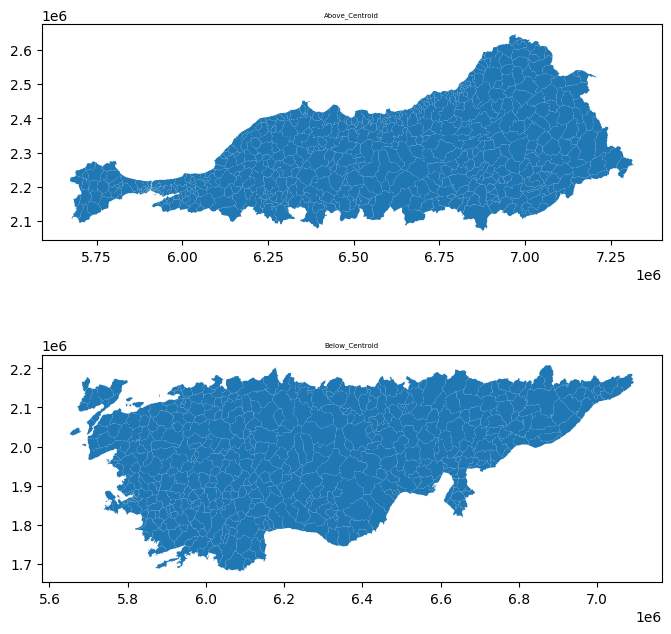

In [121]:
fig, axs = plt.subplots(nrows=2, ncols=1, sharex=False, sharey=False, figsize=(8, 8))

centroidX = centroTurkey.x[0]
centroidY = centroTurkey.y[0]

axs[0].set_title('Above_Centroid', fontsize=5)
turkey_municipalities.cx[:, centroidY:].plot(ax=axs[0])

axs[1].set_title('Below_Centroid', fontsize=5)
turkey_municipalities.cx[:, :centroidY].plot(ax=axs[1])


In [122]:
#instead of:
turkey_municipalities.cx[:centroidX,centroidY:]

,OBJECTID,adm2_tr,adm2_en,adm1_tr,adm1_en,adm1,pcode,Shape_Leng,Shape_Area,geometry
0,1,ŞİŞLİ,SISLI,İSTANBUL,ISTANBUL,TUR034,TUR034035,0.187408,0.001147,"POLYGON ((5906062.171 2199092.122, 5906201.198..."
2,3,ŞİLE,SILE,İSTANBUL,ISTANBUL,TUR034,TUR034034,1.862735,0.085721,"POLYGON ((5976273.081 2209480.330, 5976149.452..."
5,6,ŞABANÖZÜ,SABANOZU,ÇANKIRI,CANKIRI,TUR018,TUR018011,0.981981,0.049581,"POLYGON ((6272822.073 2247960.447, 6273669.905..."
15,16,ŞEFAATLİ,SEFAATLI,YOZGAT,YOZGAT,TUR066,TUR066011,1.285401,0.092348,"POLYGON ((6411502.745 2180866.439, 6411676.059..."
18,19,ÇİÇEKDAĞI,CICEKDAGI,KIRŞEHİR,KIRSEHIR,TUR040,TUR040004,1.761410,0.093437,"POLYGON ((6411803.760 2156559.784, 6411389.387..."
...,...,...,...,...,...,...,...,...,...,...
950,951,YIĞILCA,YIGILCA,DÜZCE,DUZCE,TUR081,TUR081008,1.260400,0.068001,"POLYGON ((6131418.897 2254368.584, 6131396.681..."
955,956,YOZGAT,YOZGAT,YOZGAT,YOZGAT,TUR066,TUR066014,2.713319,0.212905,"POLYGON ((6452005.004 2183455.747, 6451543.089..."
961,962,ZİLE,ZILE,TOKAT,TOKAT,TUR060,TUR060012,1.807897,0.155605,"POLYGON ((6477656.879 2259006.661, 6477440.750..."
964,965,ZEYTİNBURNU,ZEYTINBURNU,İSTANBUL,ISTANBUL,TUR034,TUR034039,0.177759,0.001228,"POLYGON ((5900650.171 2191250.511, 5900962.984..."


In [123]:
# dissolving
turkey_municipalities.cx[:centroidX,centroidY:].dissolve()

,geometry,OBJECTID,adm2_tr,adm2_en,adm1_tr,adm1_en,adm1,pcode,Shape_Leng,Shape_Area
0,"MULTIPOLYGON (((5728199.089 2105675.513, 57279...",1,ŞİŞLİ,SISLI,İSTANBUL,ISTANBUL,TUR034,TUR034035,0.187408,0.001147


In [124]:
type(turkey_municipalities.cx[:centroidX,centroidY:].dissolve())

geopandas.geodataframe.GeoDataFrame

<Axes: >

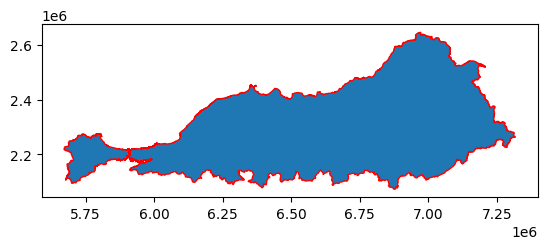

In [125]:
turkey_municipalities.cx[:,centroidY:].dissolve().plot(edgecolor='red')

<Axes: >

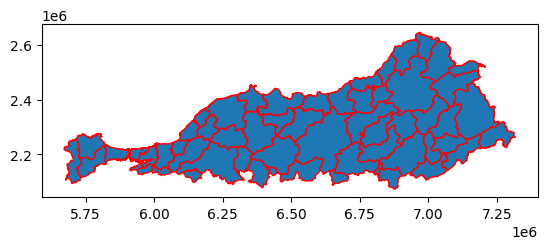

In [126]:
# the municipalities by state
turkey_municipalities.cx[:,centroidY:].dissolve(by='adm1_tr').plot(edgecolor='red')

In [127]:
turkey_municipalities.cx[:,centroidY:].unary_union

In [128]:
turkey_municipalities.cx[:, :centroidY].unary_union

In [129]:
type(turkey_municipalities.cx[:,centroidY:].unary_union)

shapely.geometry.multipolygon.MultiPolygon

In [130]:
gpd.GeoDataFrame(index=[0],
                 crs=turkey_municipalities.crs,
                 geometry=[turkey_municipalities.cx[:,centroidY:].unary_union])

,geometry
0,"MULTIPOLYGON (((5727929.069 2105462.506, 57277..."


In [131]:
# you create
Turkey_top=turkey_municipalities.cx[:,centroidY:].dissolve()
# you get
Turkey_top

,geometry,OBJECTID,adm2_tr,adm2_en,adm1_tr,adm1_en,adm1,pcode,Shape_Leng,Shape_Area
0,"MULTIPOLYGON (((5727929.069 2105462.506, 57277...",1,ŞİŞLİ,SISLI,İSTANBUL,ISTANBUL,TUR034,TUR034035,0.187408,0.001147


In [132]:
Turkey_top['zone']='N' # add column
Turkey_top['ADM0_EN']='Turkey' # add column
Turkey_top=Turkey_top.loc[:,['ADM0_EN','zone','geometry']]   # keep some

# result
Turkey_top

,ADM0_EN,zone,geometry
0,Turkey,N,"MULTIPOLYGON (((5727929.069 2105462.506, 57277..."


In [133]:
Turkey_bottom=turkey_municipalities.cx[:, :centroidY].dissolve()
Turkey_bottom['zone']='S'
Turkey_bottom['ADM0_EN']='Turkey'
Turkey_bottom=Turkey_bottom.loc[:,['ADM0_EN','zone','geometry']]

In [134]:
turkey_municipalities.rename(columns={'pcode': 'ADM2_PCODE'}, inplace=True)
turkey_municipalities

,OBJECTID,adm2_tr,adm2_en,adm1_tr,adm1_en,adm1,ADM2_PCODE,Shape_Leng,Shape_Area,geometry
0,1,ŞİŞLİ,SISLI,İSTANBUL,ISTANBUL,TUR034,TUR034035,0.187408,0.001147,"POLYGON ((5906062.171 2199092.122, 5906201.198..."
1,2,ÇİĞLİ,CIGLI,İZMİR,IZMIR,TUR035,TUR035010,1.138818,0.014430,"POLYGON ((5806655.701 1876028.020, 5806646.441..."
2,3,ŞİLE,SILE,İSTANBUL,ISTANBUL,TUR034,TUR034034,1.862735,0.085721,"POLYGON ((5976273.081 2209480.330, 5976149.452..."
3,4,ŞİRAN,SIRAN,GÜMÜŞHANE,GUMUSHANE,TUR029,TUR029005,1.425890,0.102039,"POLYGON ((6756468.913 2391300.313, 6756513.740..."
4,5,ŞİRVAN,SIRVAN,SİİRT,SIIRT,TUR056,TUR056006,1.372220,0.096102,"POLYGON ((7055046.622 2243855.722, 7054985.174..."
...,...,...,...,...,...,...,...,...,...,...
968,969,SULTANHANI,SULTANHANI,AKSARAY,AKSARAY,TUR068,TUR068008,0.874635,0.047674,"POLYGON ((6378053.126 1992817.118, 6377922.018..."
969,970,KEMALPAŞA,KEMALPASA,ARTVİN,ARTVIN,TUR008,TUR008006,0.405790,0.008003,"POLYGON ((6881345.601 2583069.689, 6880835.314..."
970,971,DERECİK,DERECIK,HAKKARİ,HAKKARI,TUR030,TUR030005,1.135608,0.046118,"POLYGON ((7298563.972 2252872.647, 7298536.962..."
971,972,AKSARAY,AKSARAY,AKSARAY,AKSARAY,TUR068,TUR068002,3.009736,0.365024,"POLYGON ((6361419.597 2057592.806, 6361723.057..."


In [135]:
# tuple with count of rows

rowsCX =(turkey_municipalities.cx[:centroTurkey.x[0], centroTurkey.y[0]:].shape[0],
          turkey_municipalities.cx[centroTurkey.x[0]:, :centroTurkey.y[0]].shape[0])
sum(rowsCX)


390

In [136]:
# coincidences:
len(set(turkey_municipalities.cx[:centroTurkey.x[0],centroTurkey.y[0]:].ADM2_PCODE). \
intersection(set(turkey_municipalities.cx[centroTurkey.x[0]:,centroTurkey.y[0]:].ADM2_PCODE)))

12

In [137]:
turkey_municipalities.shape[0]

973

<Axes: >

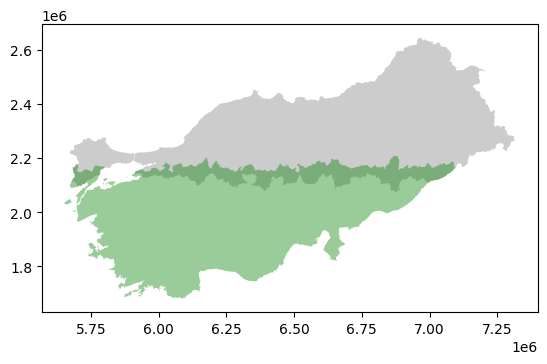

In [138]:
base=Turkey_top.plot(facecolor='grey', alpha=0.4)
Turkey_bottom.plot(ax=base,facecolor='green', alpha=0.4)


####  Dividido en 4 regiones

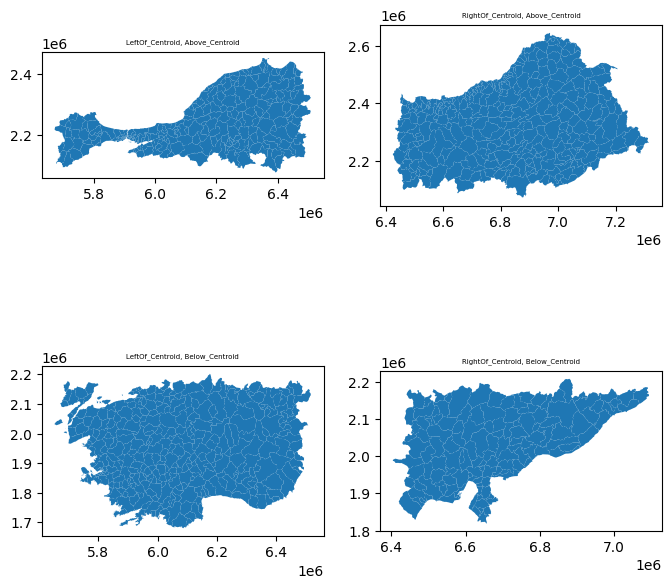

In [169]:
fig, axs = plt.subplots(nrows=2,ncols=2,sharex=False, sharey=False,figsize=(8,8))

centroidX=centroTurkey.x[0]
centroidY=centroTurkey.y[0]

axs[0,0].set_title('LeftOf_Centroid, Above_Centroid',fontsize=5)
turkey_municipalities.cx[:centroidX,centroidY:].plot(ax=axs[0,0]) 

axs[0,1].set_title('RightOf_Centroid, Above_Centroid',fontsize=5)
turkey_municipalities.cx[centroidX:,centroidY:].plot(ax=axs[0,1]) 

axs[1,0].set_title('LeftOf_Centroid, Below_Centroid',fontsize=5)
turkey_municipalities.cx[:centroidX,:centroidY].plot(ax=axs[1,0]) 

axs[1,1].set_title('RightOf_Centroid, Below_Centroid',fontsize=5)
turkey_municipalities.cx[centroidX:,:centroidY].plot(ax=axs[1,1]) ;

<Axes: >

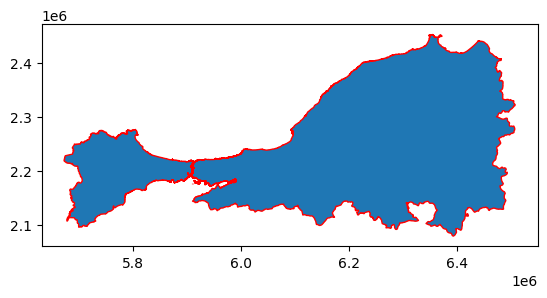

In [171]:
turkey_municipalities.cx[:centroidX,centroidY:].dissolve().plot(edgecolor='red')

<Axes: >

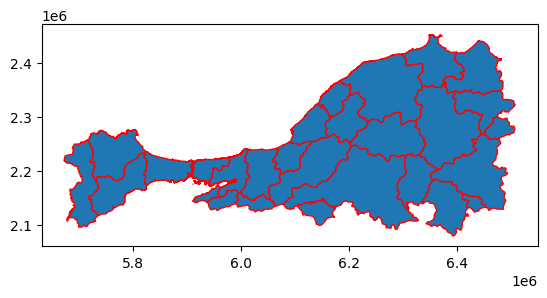

In [172]:
# the municipalities by state
turkey_municipalities.cx[:centroidX,centroidY:].dissolve(by='adm1_tr').plot(edgecolor='red')

In [173]:
turkey_municipalities.cx[:centroidX,centroidY:].unary_union

In [167]:
# you create
Turkey_topLeft=turkey_municipalities.cx[:centroidX,centroidY:].dissolve()
# you get
Turkey_topLeft

,geometry,OBJECTID,adm2_tr,adm2_en,adm1_tr,adm1_en,adm1,ADM2_PCODE,Shape_Leng,Shape_Area
0,"MULTIPOLYGON (((5728199.089 2105675.513, 57279...",1,ŞİŞLİ,SISLI,İSTANBUL,ISTANBUL,TUR034,TUR034035,0.187408,0.001147


In [175]:
Turkey_topLeft['zone']='NW' # add column
Turkey_topLeft['ADM0_EN']='Turkey'
Turkey_topLeft=Turkey_topLeft.loc[:,['ADM0_EN','zone','geometry']]   # keep some

# result
Turkey_topLeft

,ADM0_EN,zone,geometry
0,Turkey,NW,"MULTIPOLYGON (((5728199.089 2105675.513, 57279..."


In [178]:
Turkey_topRight=turkey_municipalities.cx[centroidX:,centroidY:].dissolve()
Turkey_bottomLeft=turkey_municipalities.cx[:centroidX,:centroidY].dissolve()
Turkey_bottomRight=turkey_municipalities.cx[centroidX:,:centroidY].dissolve()

Turkey_topRight['zone']='NE'
Turkey_topRight['ADM0_EN']='Turkey'
Turkey_topRight=Turkey_topRight.loc[:,['ADM0_EN','zone','geometry']] 

Turkey_bottomLeft['zone']='NE'
Turkey_bottomLeft['ADM0_EN']='Turkey'
Turkey_bottomLeft=Turkey_bottomLeft.loc[:,['ADM0_EN','zone','geometry']] 

Turkey_bottomRight['zone']='NE'
Turkey_bottomRight['ADM0_EN']='Turkey'
Turkey_bottomRight=Turkey_bottomRight.loc[:,['ADM0_EN','zone','geometry']] 

In [179]:
# tuple with count of rows
rowsCX=(turkey_municipalities.cx[:centroTurkey.x[0],centroTurkey.y[0]:].shape[0],\
        turkey_municipalities.cx[centroTurkey.x[0]:,centroTurkey.y[0]:].shape[0],\
        turkey_municipalities.cx[:centroTurkey.x[0],:centroTurkey.y[0]].shape[0],\
        turkey_municipalities.cx[centroTurkey.x[0]:,:centroTurkey.y[0]].shape[0])

sum(rowsCX)

1059

In [180]:
# coincidences:
len(set(turkey_municipalities.cx[:centroTurkey.x[0],centroTurkey.y[0]:].ADM2_PCODE). \
intersection(set(turkey_municipalities.cx[centroTurkey.x[0]:,centroTurkey.y[0]:].ADM2_PCODE)). \
intersection(set(turkey_municipalities.cx[:centroTurkey.x[0],:centroTurkey.y[0]].ADM2_PCODE)). \
intersection(set(turkey_municipalities.cx[centroTurkey.x[0]:,:centroTurkey.y[0]].ADM2_PCODE)))

1

In [181]:
turkey_municipalities.shape[0]

973

<Axes: >

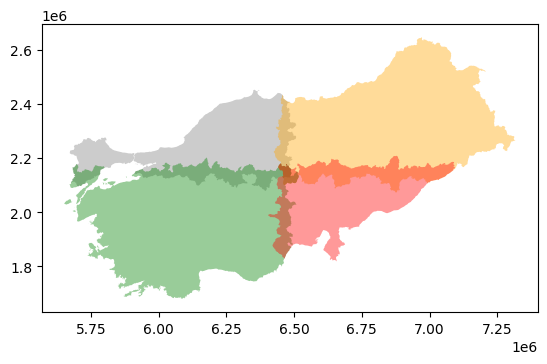

In [182]:
base=Turkey_topLeft.plot(facecolor='grey', alpha=0.4)
Turkey_topRight.plot(ax=base,facecolor='orange', alpha=0.4)
Turkey_bottomLeft.plot(ax=base,facecolor='green', alpha=0.4)
Turkey_bottomRight.plot(ax=base,facecolor='red', alpha=0.4)

## Exercise 5

1. Select some points from your maps.
    
2. Create the convex hull for those points.
    
3. Turn the hull into a GDF.
    
4. Plot the hull on top of the country.

In [139]:
Turkey_AirTopLeft=airports[airports.kind=='medium_airport'].cx[:centroidX,centroidY:]
Turkey_AirTopRight=airports[airports.kind=='medium_airport'].cx[centroidX:,centroidY:]
Turkey_AirBottomLeft=airports[airports.kind=='medium_airport'].cx[:centroidX,:centroidY]
Turkey_AirBottomRight=airports[airports.kind=='medium_airport'].cx[centroidX:,:centroidY]

<Axes: >

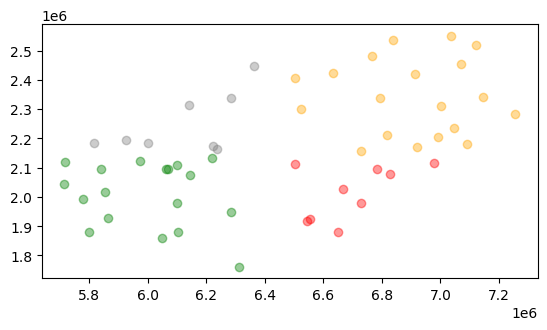

In [140]:
base=Turkey_AirTopLeft.plot(facecolor='grey', alpha=0.4)
Turkey_AirTopRight.plot(ax=base,facecolor='orange', alpha=0.4)
Turkey_AirBottomLeft.plot(ax=base,facecolor='green', alpha=0.4)
Turkey_AirBottomRight.plot(ax=base,facecolor='red', alpha=0.4)

In [141]:
Turkey_AirBottomLeft

,name,kind,latitude_deg,longitude_deg,elevation_ft,region_name,municipality,geometry
14,Gazipaşa-Alanya Airport,medium_airport,36.299217,32.300598,92.0,Antalya Province,Gazipaşa,POINT (6310745.889 1762093.165)
15,Konya Airport,medium_airport,37.979000,32.561901,3392.0,Konya Province,Konya,POINT (6285105.323 1948513.632)
21,Çardak Airport,medium_airport,37.785599,29.701300,2795.0,Denizli Province,Denizli,POINT (6047733.717 1858283.905)
22,Balıkesir Koca Seyit Airport,medium_airport,39.554600,27.013800,50.0,Balıkesir Province,Edremit,POINT (5777778.343 1993203.847)
23,Eskişehir Air Base,medium_airport,39.784100,30.582100,2581.0,Eskişehir Province,NaN,POINT (6069339.347 2093617.873)
25,Süleyman Demirel International Airport,medium_airport,37.855400,30.368401,2835.0,Isparta Province,Isparta,POINT (6102830.570 1881177.699)
31,Bursa Yenişehir Airport,medium_airport,40.255199,29.562599,764.0,Bursa Province,Bursa,POINT (5972792.769 2121414.393)
32,Çanakkale Airport,medium_airport,40.137699,26.426800,23.0,Çanakkale Province,Çanakkale,POINT (5715760.721 2045449.705)
33,Anadolu Airport,medium_airport,39.809898,30.519400,2588.0,Eskişehir Province,Eskişehir,POINT (6063463.750 2094944.656)
46,Balıkesir Merkez Airport,medium_airport,39.619301,27.926001,340.0,Balıkesir Province,NaN,POINT (5852753.619 2018213.100)


<Axes: >

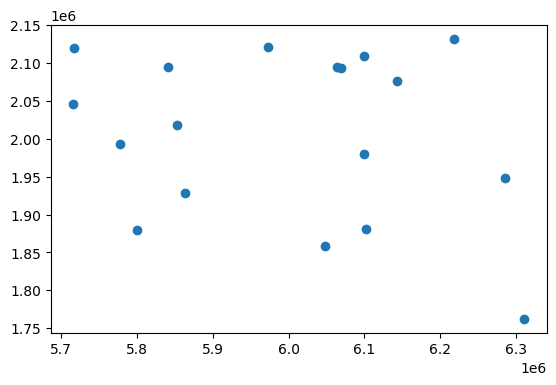

In [142]:
Turkey_AirBottomLeft.convex_hull.plot()

<Axes: >

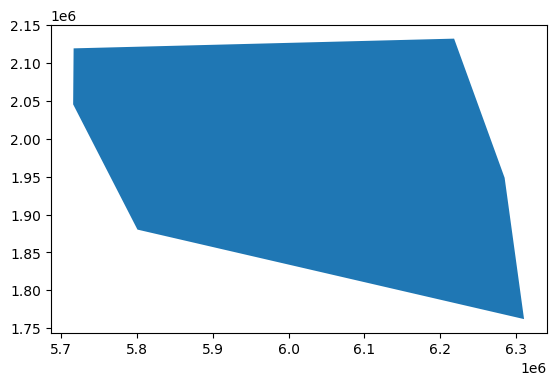

In [143]:
Turkey_AirBottomLeft.dissolve().convex_hull.plot()

In [144]:
Turkey_AirBottomLeft.dissolve().convex_hull

0    POLYGON ((6310745.889 1762093.165, 5800636.099...
dtype: geometry

<Axes: >

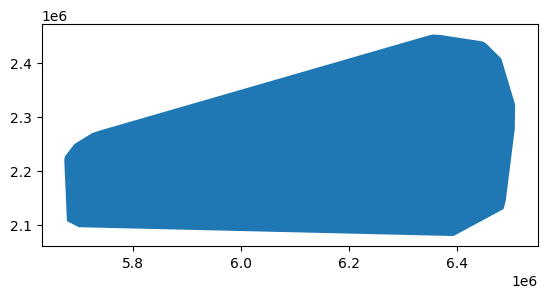

In [145]:
# SW of Turkey as convex hull
Turkey_bottomLeft=turkey_municipalities.cx[:centroidX,centroidY:].dissolve()
Turkey_bottomLeft.convex_hull.plot()

<Axes: >

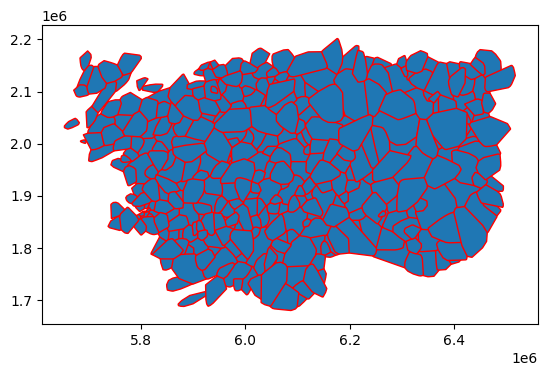

In [146]:
turkey_municipalities.cx[:centroidX,:centroidY].convex_hull.plot(edgecolor='red')

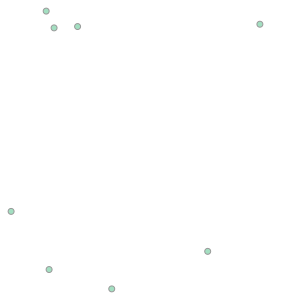

In [147]:
# just the union
large_airport=airports[airports.kind=='large_airport']
large_airport.unary_union

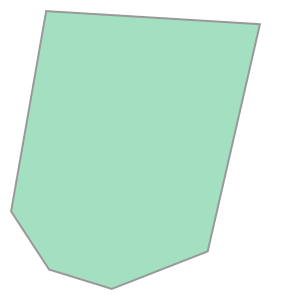

In [148]:
# hull of the union
large_airport.unary_union.convex_hull

In [149]:
LargeAirport_hull= gpd.GeoDataFrame(index=[0],
                                    crs=large_airport.crs,
                                    geometry=[large_airport.unary_union.convex_hull])
LargeAirport_hull['name']='large airports hull' # optional

# then

LargeAirport_hull

,geometry,name
0,"POLYGON ((5995663.268 1722425.026, 5885121.224...",large airports hull


<Axes: >

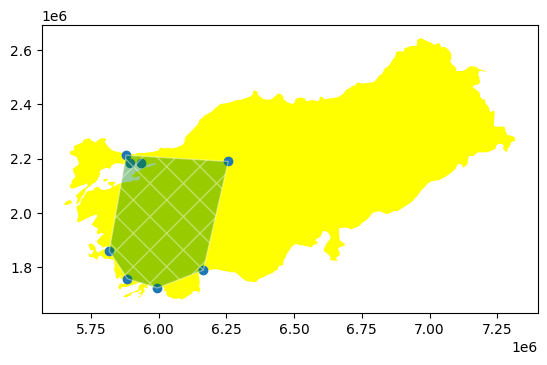

In [150]:
base=turkey.plot(facecolor='yellow')
large_airport.plot(ax=base)
LargeAirport_hull.plot(ax=base,facecolor='green',
                       edgecolor='white',alpha=0.4,
                       hatch='X')

## Exercise 6
1. Apply two of these operations to your maps.
2. Apply two of these operations to the  next maps:

In [151]:
# the north
MunisN_turkey=turkey_municipalities.cx[:,centroidY:]
# the south
MunisS_turkey=turkey_municipalities.cx[:,:centroidY]
# the west
MunisW_turkey=turkey_municipalities.cx[:centroidX,:]
# the east
MunisE_turkey=turkey_municipalities.cx[centroidX:,:]

In [152]:
#Intersection
munisMidNS_turkey=MunisN_turkey.overlay(MunisS_turkey, how="intersection",keep_geom_type=True)
munisMidNS_turkey

C:\Users\USUARIO\anaconda3\envs\nuevo\Lib\site-packages\geopandas\geodataframe.py:1815: FutureWarning: `unary_union` returned None due to all-None GeoSeries. In future, `unary_union` will return 'GEOMETRYCOLLECTION EMPTY' instead.
  merged_geom = block.unary_union


,OBJECTID_1,adm2_tr_1,adm2_en_1,adm1_tr_1,adm1_en_1,adm1_1,ADM2_PCODE_1,Shape_Leng_1,Shape_Area_1,OBJECTID_2,adm2_tr_2,adm2_en_2,adm1_tr_2,adm1_en_2,adm1_2,ADM2_PCODE_2,Shape_Leng_2,Shape_Area_2,geometry
0,14,İDİL,IDIL,ŞIRNAK,SIRNAK,TUR073,TUR073004,1.655183,0.116590,14,İDİL,IDIL,ŞIRNAK,SIRNAK,TUR073,TUR073004,1.655183,0.116590,"POLYGON ((7087905.024 2155159.861, 7087847.045..."
1,653,MİDYAT,MIDYAT,MARDİN,MARDIN,TUR047,TUR047006,1.922577,0.126262,653,MİDYAT,MIDYAT,MARDİN,MARDIN,TUR047,TUR047006,1.922577,0.126262,"POLYGON ((7008317.366 2165236.514, 7008866.308..."
2,710,NUSAYBİN,NUSAYBIN,MARDİN,MARDIN,TUR047,TUR047007,1.832015,0.109476,710,NUSAYBİN,NUSAYBIN,MARDİN,MARDIN,TUR047,TUR047007,1.832015,0.109476,"POLYGON ((7052787.420 2153334.373, 7053090.229..."
3,258,BOĞAZLIYAN,BOGAZLIYAN,YOZGAT,YOZGAT,TUR066,TUR066003,2.055339,0.158047,258,BOĞAZLIYAN,BOGAZLIYAN,YOZGAT,YOZGAT,TUR066,TUR066003,2.055339,0.158047,"POLYGON ((6486541.911 2132778.637, 6486587.447..."
4,622,KOZAKLI,KOZAKLI,NEVŞEHİR,NEVSEHIR,TUR050,TUR050006,1.452224,0.080475,622,KOZAKLI,KOZAKLI,NEVŞEHİR,NEVSEHIR,TUR050,TUR050006,1.452224,0.080475,"POLYGON ((6410937.761 2154058.362, 6410979.867..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,949,YENİPAZAR,YENIPAZAR,BİLECİK,BILECIK,TUR011,TUR011008,0.758646,0.028888,949,YENİPAZAR,YENIPAZAR,BİLECİK,BILECIK,TUR011,TUR011008,0.758646,0.028888,"POLYGON ((6043206.532 2127447.033, 6042956.893..."
57,661,MALKARA,MALKARA,TEKİRDAĞ,TEKIRDAG,TUR059,TUR059006,1.573034,0.132786,661,MALKARA,MALKARA,TEKİRDAĞ,TEKIRDAG,TUR059,TUR059006,1.573034,0.132786,"POLYGON ((5729730.311 2158853.277, 5730510.248..."
58,835,SÜLEYMANPAŞA,SULEYMANPASA,TEKİRDAĞ,TEKIRDAG,TUR059,TUR059010,1.601714,0.112639,835,SÜLEYMANPAŞA,SULEYMANPASA,TEKİRDAĞ,TEKIRDAG,TUR059,TUR059010,1.601714,0.112639,"POLYGON ((5800137.863 2163379.174, 5800133.536..."
59,518,ÇINARCIK,CINARCIK,YALOVA,YALOVA,TUR077,TUR077004,0.751068,0.018693,518,ÇINARCIK,CINARCIK,YALOVA,YALOVA,TUR077,TUR077004,0.751068,0.018693,"POLYGON ((5932993.249 2156602.189, 5932865.358..."


In [153]:
MunisN_turkey.sjoin(MunisS_turkey, how="inner", predicate='contains')

,OBJECTID_left,adm2_tr_left,adm2_en_left,adm1_tr_left,adm1_en_left,adm1_left,ADM2_PCODE_left,Shape_Leng_left,Shape_Area_left,geometry,index_right,OBJECTID_right,adm2_tr_right,adm2_en_right,adm1_tr_right,adm1_en_right,adm1_right,ADM2_PCODE_right,Shape_Leng_right,Shape_Area_right
13,14,İDİL,IDIL,ŞIRNAK,SIRNAK,TUR073,TUR073004,1.655183,0.116590,"POLYGON ((7087922.212 2155167.665, 7087905.024...",13,14,İDİL,IDIL,ŞIRNAK,SIRNAK,TUR073,TUR073004,1.655183,0.116590
44,45,İPSALA,IPSALA,EDİRNE,EDIRNE,TUR022,TUR022004,1.667303,0.078925,"POLYGON ((5677412.329 2106435.485, 5677415.491...",44,45,İPSALA,IPSALA,EDİRNE,EDIRNE,TUR022,TUR022004,1.667303,0.078925
55,56,İZNİK,IZNIK,BURSA,BURSA,TUR016,TUR016006,1.265334,0.079962,"POLYGON ((5965126.706 2130721.607, 5965292.763...",55,56,İZNİK,IZNIK,BURSA,BURSA,TUR016,TUR016006,1.265334,0.079962
79,80,AKÇADAĞ,AKCADAG,MALATYA,MALATYA,TUR044,TUR044001,1.569124,0.115247,"POLYGON ((6689854.058 2131191.727, 6689875.302...",79,80,AKÇADAĞ,AKCADAG,MALATYA,MALATYA,TUR044,TUR044001,1.569124,0.115247
87,88,AKKIŞLA,AKKISLA,KAYSERİ,KAYSERI,TUR038,TUR038001,0.833478,0.038552,"POLYGON ((6543159.740 2151477.745, 6543364.400...",87,88,AKKIŞLA,AKKISLA,KAYSERİ,KAYSERI,TUR038,TUR038001,0.833478,0.038552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
924,925,YALOVA,YALOVA,YALOVA,YALOVA,TUR077,TUR077006,0.592664,0.014592,"POLYGON ((5941359.509 2160044.823, 5941369.287...",924,925,YALOVA,YALOVA,YALOVA,YALOVA,TUR077,TUR077006,0.592664,0.014592
933,934,YEŞİLLİ,YESILLI,MARDİN,MARDIN,TUR047,TUR047010,0.672335,0.017081,"POLYGON ((6984691.359 2144440.948, 6984979.465...",933,934,YEŞİLLİ,YESILLI,MARDİN,MARDIN,TUR047,TUR047010,0.672335,0.017081
935,936,YEŞİLYURT,YESILYURT,MALATYA,MALATYA,TUR044,TUR044013,1.870483,0.098283,"POLYGON ((6767711.627 2141707.051, 6767543.144...",935,936,YEŞİLYURT,YESILYURT,MALATYA,MALATYA,TUR044,TUR044013,1.870483,0.098283
945,946,YENİFAKILI,YENIFAKILI,YOZGAT,YOZGAT,TUR066,TUR066012,1.076620,0.040671,"POLYGON ((6431613.369 2152194.613, 6432065.658...",945,946,YENİFAKILI,YENIFAKILI,YOZGAT,YOZGAT,TUR066,TUR066012,1.076620,0.040671


<Axes: >

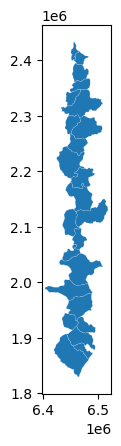

In [154]:
# keeping the overlay
munisMidWE_turkey=MunisW_turkey.overlay(MunisE_turkey, how="intersection",keep_geom_type=True)
munisMidWE_turkey.plot(edgecolor='white',linewidth=0.1)

In [155]:
#Union
munisMidNS_turkey.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   OBJECTID_1    61 non-null     int64   
 1   adm2_tr_1     61 non-null     object  
 2   adm2_en_1     61 non-null     object  
 3   adm1_tr_1     61 non-null     object  
 4   adm1_en_1     61 non-null     object  
 5   adm1_1        61 non-null     object  
 6   ADM2_PCODE_1  61 non-null     object  
 7   Shape_Leng_1  61 non-null     float64 
 8   Shape_Area_1  61 non-null     float64 
 9   OBJECTID_2    61 non-null     int64   
 10  adm2_tr_2     61 non-null     object  
 11  adm2_en_2     61 non-null     object  
 12  adm1_tr_2     61 non-null     object  
 13  adm1_en_2     61 non-null     object  
 14  adm1_2        61 non-null     object  
 15  ADM2_PCODE_2  61 non-null     object  
 16  Shape_Leng_2  61 non-null     float64 
 17  Shape_Area_2  61 non-null     float64 
 18  geom

In [156]:
munisMidWE_turkey.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   OBJECTID_1    24 non-null     int64   
 1   adm2_tr_1     24 non-null     object  
 2   adm2_en_1     24 non-null     object  
 3   adm1_tr_1     24 non-null     object  
 4   adm1_en_1     24 non-null     object  
 5   adm1_1        24 non-null     object  
 6   ADM2_PCODE_1  24 non-null     object  
 7   Shape_Leng_1  24 non-null     float64 
 8   Shape_Area_1  24 non-null     float64 
 9   OBJECTID_2    24 non-null     int64   
 10  adm2_tr_2     24 non-null     object  
 11  adm2_en_2     24 non-null     object  
 12  adm1_tr_2     24 non-null     object  
 13  adm1_en_2     24 non-null     object  
 14  adm1_2        24 non-null     object  
 15  ADM2_PCODE_2  24 non-null     object  
 16  Shape_Leng_2  24 non-null     float64 
 17  Shape_Area_2  24 non-null     float64 
 18  geom

In [157]:
keep=['adm1_tr_1','adm2_tr_1','geometry']
munisMidNS_turkey=munisMidNS_turkey.loc[:,keep]
munisMidWE_turkey=munisMidWE_turkey.loc[:,keep]


In [158]:
# now 
munisMidNS_turkey.overlay(munisMidWE_turkey,how="union",keep_geom_type=True)

,adm1_tr_1_1,adm2_tr_1_1,adm1_tr_1_2,adm2_tr_1_2,geometry
0,YOZGAT,BOĞAZLIYAN,YOZGAT,BOĞAZLIYAN,"POLYGON ((6486587.447 2132101.755, 6486630.939..."
1,KAYSERİ,KOCASİNAN,KAYSERİ,KOCASİNAN,"POLYGON ((6464221.549 2099667.265, 6463548.626..."
2,ŞIRNAK,İDİL,NaN,NaN,"POLYGON ((7087905.024 2155159.861, 7087847.045..."
3,MARDİN,MİDYAT,NaN,NaN,"POLYGON ((7008317.366 2165236.514, 7008866.308..."
4,MARDİN,NUSAYBİN,NaN,NaN,"POLYGON ((7052787.420 2153334.373, 7053090.229..."
...,...,...,...,...,...
78,NaN,NaN,NEVŞEHİR,ÜRGÜP,"POLYGON ((6466408.103 2058122.199, 6465960.748..."
79,NaN,NaN,YOZGAT,ÇEKEREK,"POLYGON ((6449315.755 2267218.580, 6449726.955..."
80,NaN,NaN,MERSİN,ERDEMLİ,"POLYGON ((6482986.966 1861288.628, 6482945.685..."
81,NaN,NaN,YOZGAT,SARIKAYA,"POLYGON ((6450885.506 2181282.370, 6451304.837..."


In [159]:
# appending
pd.concat([munisMidNS_turkey,munisMidWE_turkey],ignore_index=True)

,adm1_tr_1,adm2_tr_1,geometry
0,ŞIRNAK,İDİL,"POLYGON ((7087905.024 2155159.861, 7087847.045..."
1,MARDİN,MİDYAT,"POLYGON ((7008317.366 2165236.514, 7008866.308..."
2,MARDİN,NUSAYBİN,"POLYGON ((7052787.420 2153334.373, 7053090.229..."
3,YOZGAT,BOĞAZLIYAN,"POLYGON ((6486541.911 2132778.637, 6486587.447..."
4,NEVŞEHİR,KOZAKLI,"POLYGON ((6410937.761 2154058.362, 6410979.867..."
...,...,...,...
80,NEVŞEHİR,ÜRGÜP,"POLYGON ((6466408.103 2058122.199, 6465960.748..."
81,YOZGAT,ÇEKEREK,"POLYGON ((6449315.755 2267218.580, 6449726.955..."
82,MERSİN,ERDEMLİ,"POLYGON ((6482986.966 1861288.628, 6482945.685..."
83,YOZGAT,SARIKAYA,"POLYGON ((6450686.014 2180939.050, 6450885.506..."


<Axes: >

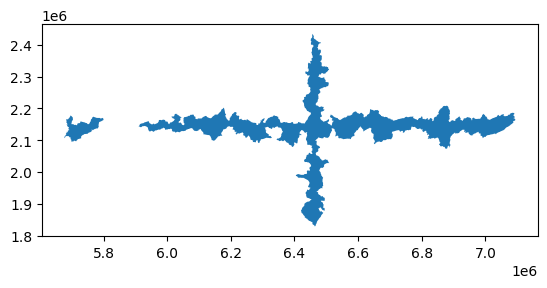

In [160]:
munisMidNS_turkey.dissolve().overlay(munisMidWE_turkey.dissolve(), how="union",keep_geom_type=True).dissolve().plot()

In [161]:
muniMidTurkey=munisMidNS_turkey.dissolve().overlay(munisMidWE_turkey.dissolve(), how="union",keep_geom_type=True).dissolve()
muniMidTurkey

,geometry,adm1_tr_1_1,adm2_tr_1_1,adm1_tr_1_2,adm2_tr_1_2
0,"MULTIPOLYGON (((6482665.234 1859943.206, 64825...",ŞIRNAK,İDİL,YOZGAT,BOĞAZLIYAN


In [163]:
# some cleaning

muniMidTurkey['adm0_1']='Turkey'
muniMidTurkey['zone']='middles'
muniMidTurkey=muniMidTurkey.loc[:,['adm0_1','zone','geometry']]   
muniMidTurkey

,adm0_1,zone,geometry
0,Turkey,middles,"MULTIPOLYGON (((6482665.234 1859943.206, 64825..."


<Axes: >

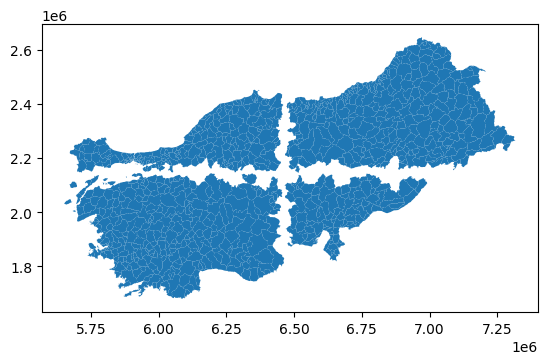

In [164]:
#Difference
# with the municipalities
turkey_municipalities.overlay(muniMidTurkey, how='difference').plot()

<Axes: >

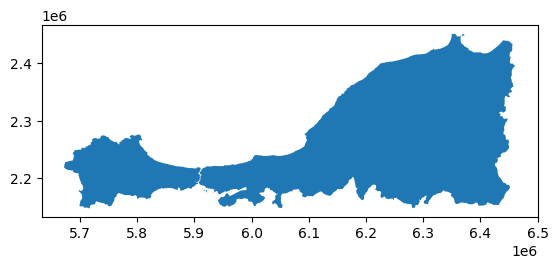

In [183]:
# with the zones
Turkey_topLeft.overlay(muniMidTurkey, how='difference').plot()

<Axes: >

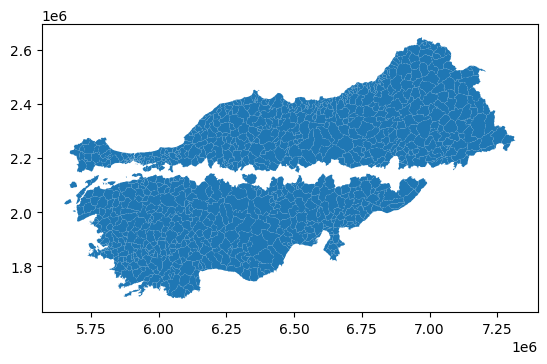

In [184]:
#Symmetric Difference
MunisN_turkey.overlay(MunisS_turkey, how="symmetric_difference",keep_geom_type=False).plot()

<Axes: >

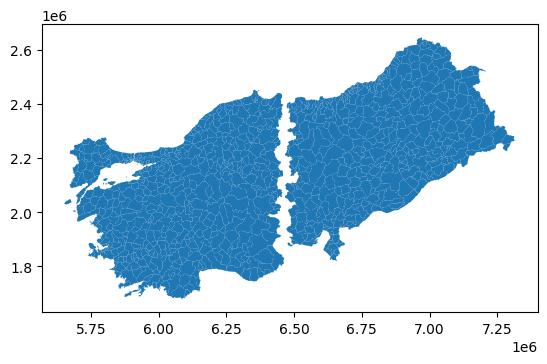

In [185]:
MunisW_turkey.overlay(MunisE_turkey, how="symmetric_difference",keep_geom_type=False).plot()

In [186]:
# hulls for the mid size airports:
Turkey_AirTopLeft_hull=Turkey_AirTopLeft.dissolve().convex_hull
Turkey_AirTopRight_hull=Turkey_AirTopRight.dissolve().convex_hull
Turkey_AirBottomLeft_hull=Turkey_AirBottomLeft.dissolve().convex_hull
Turkey_AirBottomRight_hull=Turkey_AirBottomRight.dissolve().convex_hull

<Axes: >

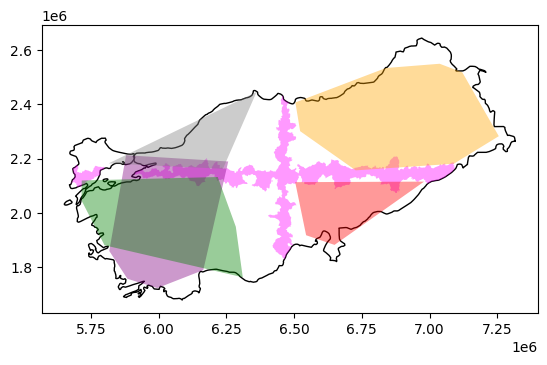

In [187]:
base = turkey.plot(color='white', edgecolor='black') #unprojected
muniMidTurkey.plot(ax=base,facecolor='magenta',alpha=0.4) #unprojected
LargeAirport_hull.plot(ax=base,facecolor='purple',alpha=0.4)
Turkey_AirTopLeft_hull.plot(ax=base,facecolor='grey', alpha=0.4)
Turkey_AirTopRight_hull.plot(ax=base,facecolor='orange', alpha=0.4)
Turkey_AirBottomLeft_hull.plot(ax=base,facecolor='green', alpha=0.4)
Turkey_AirBottomRight_hull.plot(ax=base,facecolor='red', alpha=0.4)

In [189]:
# non valid
turkey_municipalities[~turkey_municipalities.is_valid]

,OBJECTID,adm2_tr,adm2_en,adm1_tr,adm1_en,adm1,ADM2_PCODE,Shape_Leng,Shape_Area,geometry
